#### 30592 - Martucci Luca (3194553)

This notebook implements an evolutionary algorithm to find minimal surfaces under physical and geometric constraints. The objective is to minimize the surface area of a two-dimensional heightmap $z=f(x, y)$, defined over a square domain with fixed boundary conditions, while also preserving a target enclosed volume.

Rather than solving the minimal surface PDE directly, we would like to implement evolutionary computing techniques to evolve a population of candidate surfaces over generations. By combining real-valued representations with constraint-handling strategies such as volume rescaling and adaptive penalty weighting, the EA we propose efficiently discovers smooth, physically plausible surfaces that satisfy the imposed conditions.

### Configuration Parameters

We define the key hyperparameters that control the evolutionary algorithm and the discretized surface model:

- the surface is represented as a N×N heightmap $
Z[i, j] \approx f(x_i, y_j)$ This choice of represantation is crucially adequate, as the total surface area can now be approximated using a finite-difference scheme derived from the formula $
A[f] = \iint_{[0,1]^2} \sqrt{1 + |\nabla f(x, y)|^2} \, dx\,dy
$, boundary conditions are easy to impose and volume constraints can be computed as a sum over heights. Moreover, it is compatible with evolutionary operators:
  - Mutation and crossover can be defined directly in grid space.
  - Regularity and smoothness are naturally preserved via filtering and blending.



- the population size is number of candidate surfaces evolved each generation.
- the total number of generations: how many iterations of evolution to run. More generations allow better convergence.

- Elitism: the number of top individuals preserved unmodified between generations. Prevents regression by retaining high-quality solutions.

- We set our target volume, the total volume under the surface, equal to 1 by normalization, as the original minimal surface problem has the only constraint of fixed volume. 

- Initial penalty weight for volume deviation: dynamically adjusted during evolution to balance constraint enforcement.

- Initial strength of random mutations: controls how much noise is added during mutation. Adjusted adaptively during evolution.

- Acceptable deviation from the target volume. If the volume is within this range, the penalty is reduced; otherwise, it increases.

These parameters together define how the search space is explored and how constraint satisfaction is balanced with objective minimization.


In [13]:
# CONFIGURATION

N = 100  # Grid resolution
POP_SIZE = 100
GENERATIONS = 100
ELITE_COUNT = 2
V_TARGET = 1.0
INITIAL_LAMBDA = 100.0
INITIAL_MUTATION_SCALE = 0.05
VOLUME_TOLERANCE = 0.01

### Initialization of Individuals

We now define how each surface (individual) in the population is initially generated.

- Surfaces are represented as 2D arrays of real numbers, corresponding to height values on a grid.
- Interior values are initialized randomly in the range [0, 1], creating a diverse starting population.
- All boundary values (edges of the grid) are explicitly set to zero, enforcing Dirichlet boundary conditions, a necessary condition for minimal surface problems where the surface must be fixed to a frame.

In [14]:
# INITIALIZATION
import numpy as np

def generate_individual_with_boundary():
    Z = np.random.rand(N, N)
    Z[0, :] = 0
    Z[-1, :] = 0
    Z[:, 0] = 0
    Z[:, -1] = 0
    return Z

### Evaluation Functions

These functions define the fitness landscape for the evolutionary algorithm by measuring how well a candidate surface satisfies the objective and constraints.

#### `compute_surface_area(Z)`
Approximates the total surface area of the 3D surface using finite differences.

- Calculates the partial derivatives ∂z/∂x and ∂z/∂y using `np.gradient`.
- Applies the formula:
  $$
  A = \iint \sqrt{1 + \left(\frac{\partial z}{\partial x}\right)^2 + \left(\frac{\partial z}{\partial y}\right)^2} \, dx\,dy
  $$
- Returns the sum over all grid cells, scaled by the grid spacing.

#### `compute_volume(Z)`
Approximates the total volume under the surface:

- Computes a discrete Riemann sum:
  $$
  V = \iint z(x, y) \, dx\,dy
  $$
- Returns the total as a scalar.

#### `compute_fitness(Z, lambda_penalty)`
Combines area minimization with volume constraint enforcement.

- Computes both the surface area and volume of the input surface.
- Applies a soft penalty based on deviation from the target volume:
  $$
  \text{Fitness}(Z) = \text{Area}(Z) + \lambda \cdot (\text{Volume}(Z) - V_{\text{target}})^2
  $$
- Returns three values:
  - The total fitness value (to minimize)
  - The surface area (for analysis)
  - The volume (for diagnostics and repair)

This fitness function is the core of the optimization, it guides the evolution of surfaces toward low-area configurations that respect the physical volume constraint.


In [15]:
# EVALUATION FUNCTIONS

def compute_surface_area(Z):
    dx = 1.0 / (N - 1)
    dy = 1.0 / (N - 1)
    dzdx = np.gradient(Z, axis=0) / dx
    dzdy = np.gradient(Z, axis=1) / dy
    area = np.sqrt(1 + dzdx**2 + dzdy**2)
    return np.sum(area) * dx * dy

def compute_volume(Z):
    dx = 1.0 / (N - 1)
    dy = 1.0 / (N - 1)
    return np.sum(Z) * dx * dy

def compute_fitness(Z, lambda_penalty):
    area = compute_surface_area(Z)
    volume = compute_volume(Z)
    penalty = lambda_penalty * (volume - V_TARGET)**2
    return area + penalty, area, volume

### Variation Operators

These functions define how new candidate surfaces (offspring) are created during the evolutionary process by introducing variation into the population.

#### `mutate_with_boundary(Z, scale)`
Applies a smooth mutation to a surface by adding local random noise:

- A binary mask selects ~10% of interior points for mutation.
- Gaussian noise scaled by `scale` is added to those points.
- The mutated surface is smoothed using a Gaussian filter (`sigma=1`) to maintain physical plausibility.
- Boundary values are reset to zero to preserve Dirichlet conditions.

This operator mimics biological mutation and promotes exploration of the surface space without breaking physical constraints.

#### `crossover_blend(Z1, Z2, alpha)`
Creates a new surface by linearly blending two parents:

- Each point in the child surface is computed as a weighted average of the corresponding points in the two parents.
- The `alpha` parameter controls the blend ratio (default is 50/50).
- Boundary values are enforced post-operation.

This operator mimics reproduction, combining traits from both parents and encouraging recombination of useful surface features.

#### `rescale_to_target_volume(Z, target_volume)`
Adjusts the height values of the surface to exactly match a desired total volume:

- Computes a scale factor based on the current and target volume.
- Scales all height values accordingly.
- Reapplies zero-boundary conditions to avoid artifacts from rescaling.

This acts as a repair mechanism, ensuring that all offspring satisfy the hard volume constraint, allowing the fitness function to focus purely on area minimization.

Together, these operators drive the search and optimization process, balancing global structure preservation with local innovation.


In [16]:
# VARIATION OPERATORS
from scipy.ndimage import gaussian_filter

def mutate_with_boundary(Z, scale):
    Z_mut = Z.copy()
    noise = np.random.normal(0, scale, size=Z.shape)
    mask = np.random.rand(*Z.shape) < 0.1
    mask[0, :] = 0
    mask[-1, :] = 0
    mask[:, 0] = 0
    mask[:, -1] = 0
    Z_mut += noise * mask
    Z_mut = gaussian_filter(Z_mut, sigma=1)
    Z_mut[0, :] = 0
    Z_mut[-1, :] = 0
    Z_mut[:, 0] = 0
    Z_mut[:, -1] = 0
    return Z_mut

def crossover_blend(Z1, Z2, alpha=0.5):
    child = alpha * Z1 + (1 - alpha) * Z2
    child[0, :] = 0
    child[-1, :] = 0
    child[:, 0] = 0
    child[:, -1] = 0
    return child

def rescale_to_target_volume(Z, target_volume=V_TARGET):
    current_volume = compute_volume(Z)
    if current_volume == 0:
        return Z
    scale_factor = target_volume / current_volume
    Z_rescaled = Z * scale_factor
    Z_rescaled[0, :] = 0
    Z_rescaled[-1, :] = 0
    Z_rescaled[:, 0] = 0
    Z_rescaled[:, -1] = 0
    return Z_rescaled

### Selection Operators

These functions determine which individuals from the population are chosen to reproduce in the next generation. Selection is driven by fitness and diversity, and is critical to balancing exploitation of good solutions with exploration of new ones.

#### `tournament_selection(pop, fitnesses, k)`
Selects one parent from the population using tournament selection:

- Randomly samples `k` individuals from the population.
- Returns the one with the lowest fitness (i.e., best).
- This method introduces selection pressure while preserving some stochasticity.

#### `compute_population_diversity(pop)`
Estimates how diverse the population is by computing the Euclidean distance of each individual from the population centroid:

- The centroid is computed as the mean surface.
- Diversity is measured as the $L^2$ (Frobenius) norm  between each individual and the centroid.

Together, these selection tools help shape the evolutionary pressure that drives the population toward better minimal surfaces.


In [17]:
# SELECTION

def tournament_selection(pop, fitnesses, k=3):
    indices = np.random.choice(len(pop), k, replace=False)
    best = min(indices, key=lambda idx: fitnesses[idx])
    return pop[best]

def compute_population_diversity(pop):
    centroid = np.mean(pop, axis=0)
    return [np.linalg.norm(ind - centroid) for ind in pop]


### Evolutionary Loop

This is the core of the evolutionary algorithm, where the population of surfaces evolves over time. Each generation applies evaluation, selection, variation, constraint enforcement, and adaptive parameter tuning.

#### Initialization
- A population of random surfaces is created using `generate_individual_with_boundary()`.
- Tracking lists are initialized for storing the best fitness, area, volume, and surface per generation.
- The mutation rate and volume penalty (`lambda_penalty`) start at user-defined initial values.

#### For Each Generation:
1. **Evaluate Fitness**  
   - Each surface is evaluated using the `compute_fitness()` function.
   - Fitness is based on surface area and a penalty for deviation from the target volume.

2. **Elitism (Preserve Best Solutions)**  
   - The top `ELITE_COUNT` individuals are directly copied to the next generation.

3. **Selection & Variation**
   - New individuals are generated until the population is full:
     - Two parents are selected via tournament selection.
     - A child is created using blended crossover.
     - The child is mutated and volume-corrected using repair.
     - The child is added to the new population.

4. **Update Best Individual**
   - The current best solution is identified and recorded for plotting and animation.

5. **Logging**
   - Every 10 generations, the current best fitness, area, and volume are printed for monitoring.

6. **Adaptive Mutation Control**
   - If fitness stagnates, mutation strength increases to encourage exploration.
   - If fitness improves, mutation decreases for refinement.

7. **Adaptive Penalty Control**
   - If the volume is too far from the target, the volume penalty `lambda` increases.
   - If the volume is close enough, `lambda` is reduced to avoid dominating the fitness.

This loop continues for a fixed number of generations, gradually guiding the population toward minimal surfaces that meet the volume constraint and boundary conditions.


In [18]:
# EVOLUTIONARY LOOP

population = [generate_individual_with_boundary() for _ in range(POP_SIZE)]
best_fitnesses = []
surface_areas = []
volumes = []
best_solutions = []
mutation_scale = INITIAL_MUTATION_SCALE
lambda_penalty = INITIAL_LAMBDA

for gen in range(GENERATIONS):
    evaluations = [compute_fitness(ind, lambda_penalty) for ind in population]
    fitnesses = [f[0] for f in evaluations]
    areas = [f[1] for f in evaluations]
    vols = [f[2] for f in evaluations]
    diversities = compute_population_diversity(population)
    new_population = []

    elite_indices = np.argsort(fitnesses)[:ELITE_COUNT]
    for idx in elite_indices:
        new_population.append(np.copy(population[idx]))

    while len(new_population) < POP_SIZE:
        parent1 = tournament_selection(population, fitnesses)
        parent2 = tournament_selection(population, fitnesses)
        child = crossover_blend(parent1, parent2)
        child = mutate_with_boundary(child, mutation_scale)
        child = rescale_to_target_volume(child)
        new_population.append(child)

    population = new_population
    best_idx = np.argmin(fitnesses)
    best_ind = population[best_idx]
    best_fit = fitnesses[best_idx]
    best_area = areas[best_idx]
    best_volume = vols[best_idx]

    best_fitnesses.append(best_fit)
    surface_areas.append(best_area)
    volumes.append(best_volume)
    best_solutions.append(np.copy(best_ind))

    if gen % 10 == 0:
        print(f"Gen {gen:3d} | Fit: {best_fit:.4f} | Area: {best_area:.4f} | Vol: {best_volume:.6f}")

    if gen > 10 and best_fitnesses[-1] >= best_fitnesses[-2]:
        mutation_scale *= 1.05
    else:
        mutation_scale *= 0.95
    mutation_scale = np.clip(mutation_scale, 0.001, 0.1)

    vol_error = abs(best_volume - V_TARGET)
    if vol_error > VOLUME_TOLERANCE:
        lambda_penalty *= 1.1
    else:
        lambda_penalty *= 0.95
    lambda_penalty = np.clip(lambda_penalty, 10, 5000)

Gen   0 | Fit: 52.8177 | Area: 27.3476 | Vol: 0.495321
Gen  10 | Fit: 5.4831 | Area: 5.4831 | Vol: 1.000000
Gen  20 | Fit: 5.2543 | Area: 5.2543 | Vol: 1.000000
Gen  30 | Fit: 5.1576 | Area: 5.1576 | Vol: 1.000000
Gen  40 | Fit: 5.1046 | Area: 5.1046 | Vol: 1.000000
Gen  50 | Fit: 5.0715 | Area: 5.0715 | Vol: 1.000000
Gen  60 | Fit: 5.0498 | Area: 5.0498 | Vol: 1.000000
Gen  70 | Fit: 5.0349 | Area: 5.0349 | Vol: 1.000000
Gen  80 | Fit: 5.0249 | Area: 5.0249 | Vol: 1.000000
Gen  90 | Fit: 5.0183 | Area: 5.0183 | Vol: 1.000000


### Visualization and Analysis



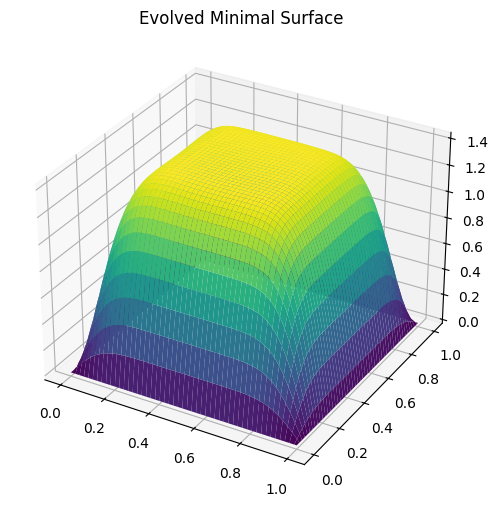

In [22]:
import matplotlib.pyplot as plt
from matplotlib import animation

def plot_surface(Z, title="Evolved Minimal Surface"):
    X, Y = np.meshgrid(np.linspace(0, 1, N), np.linspace(0, 1, N))
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d')
    ax.plot_surface(X, Y, Z, cmap='viridis')
    ax.set_title(title)
    plt.show()

final_evaluations = [compute_fitness(ind, lambda_penalty) for ind in population]
final_fitnesses = [f[0] for f in final_evaluations]
best_idx = np.argmin(final_fitnesses)
best_solution = population[best_idx]
plot_surface(best_solution)

plt.show()

The best-evolved surface is here visualized. we are satisfies by the shape, smoothness, and symmetry of the final result.


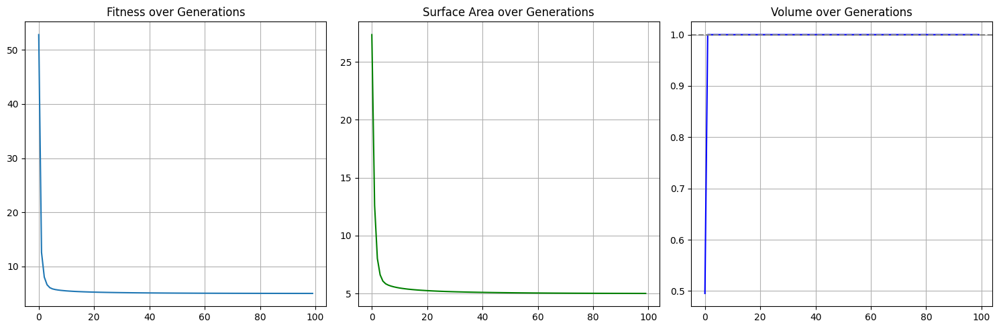

In [23]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.plot(best_fitnesses, label="Fitness")
plt.title("Fitness over Generations")
plt.grid(True)

plt.subplot(1, 3, 2)
plt.plot(surface_areas, label="Surface Area", color='green')
plt.title("Surface Area over Generations")
plt.grid(True)

plt.subplot(1, 3, 3)
plt.plot(volumes, label="Volume", color='blue')
plt.axhline(V_TARGET, linestyle='--', color='gray', label="Target Volume")
plt.title("Volume over Generations")
plt.grid(True)

plt.tight_layout()
plt.show()

These plots help us verify that:
- The algorithm is converging as expected.
- The volume constraint is being satisfied.
- The fitness reflects real improvement in physical realism.

In [24]:
# ANIMATION 
from IPython.display import HTML

fig = plt.figure(figsize=(6, 5))
ax = fig.add_subplot(111, projection='3d')
X, Y = np.meshgrid(np.linspace(0, 1, N), np.linspace(0, 1, N))

ax.set_zlim(0, 1)
ax.set_title("Evolution of Minimal Surface")

def update(frame):
    ax.clear()
    ax.set_zlim(0, 1)
    ax.set_title(f"Generation {frame}")
    ax.plot_surface(X, Y, best_solutions[frame], cmap='viridis')

ani = animation.FuncAnimation(fig, update, frames=len(best_solutions), interval=100)

plt.close(fig)
HTML(ani.to_jshtml())


This animated 3D plot shows how the best surface changes across generations:

- Each frame corresponds to a saved best solution from one generation.
- Helps visualize the emergence of structure over time, from noisy initial surfaces to smooth, minimal-area solutions.

The animation reveals how the algorithm explores and refines the shape of the surface, a powerful way to build intuition about the optimization process.